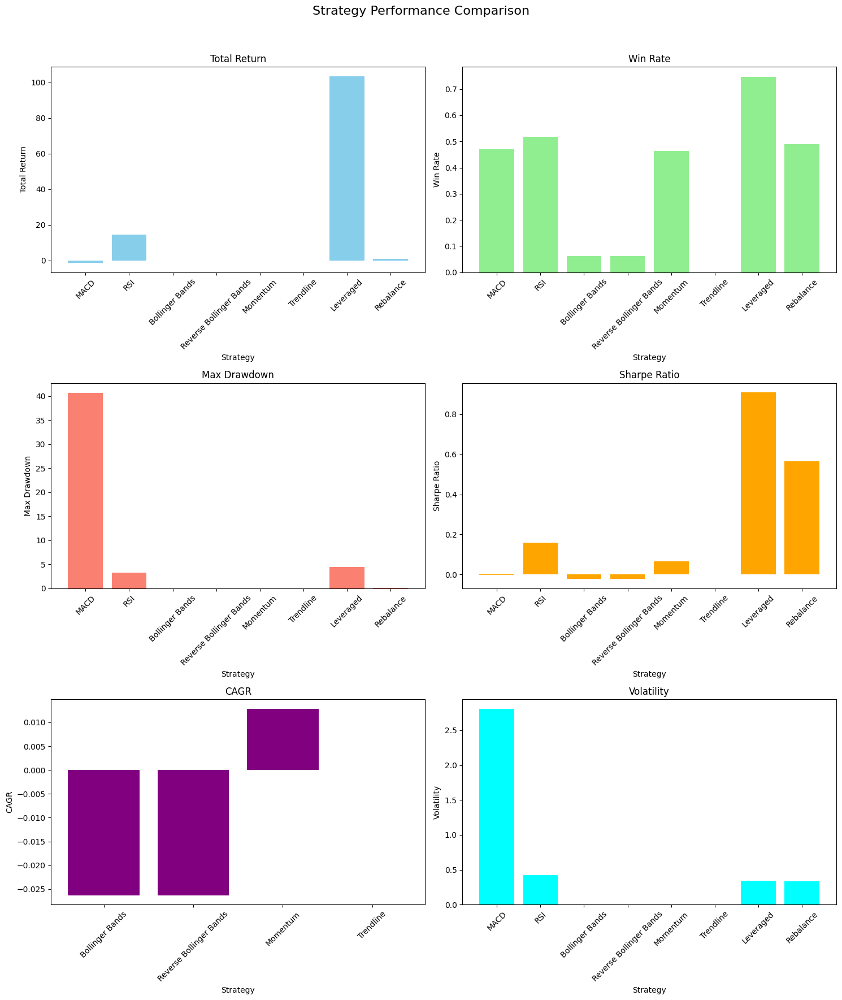

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# 전략별 성과 지표 데이터
data = {
    'Strategy': ['MACD', 'RSI', 'Bollinger Bands', 'Reverse Bollinger Bands', 'Momentum', 'Trendline', 'Leveraged', 'Rebalance'],
    'Total Return': [-1.4502, 14.3636, -0.0168, -0.0168, 0.0080, 0.0000, 103.4286, 0.7161],
    'Win Rate': [0.4695, 0.5178, 0.0623, 0.0623, 0.4638, 0.0000, 0.7477, 0.4904],
    'Max Drawdown': [40.6954, 3.3231, 0.0504, 0.0504, 0.0065, float('nan'), 4.5217, 0.0704],
    'Sharpe Ratio': [-0.0006, 0.1593, -0.0230, -0.0230, 0.0672, float('nan'), 0.9093, 0.5661],
    'CAGR': [float('nan'), float('nan'), -0.0263, -0.0263, 0.0129, 0.0000, float('nan'), float('nan')],
    'Volatility': [2.8055, 0.4221, 0.0023, 0.0023, 0.0006, float('nan'), 0.3428, 0.3316]
}

# 데이터프레임 생성
df = pd.DataFrame(data)

# 시각화
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
fig.suptitle('Strategy Performance Comparison', fontsize=16)

# Total Return 시각화
axes[0, 0].bar(df['Strategy'], df['Total Return'], color='skyblue')
axes[0, 0].set_title('Total Return')
axes[0, 0].set_xlabel('Strategy')
axes[0, 0].set_ylabel('Total Return')
axes[0, 0].tick_params(axis='x', rotation=45)

# Win Rate 시각화
axes[0, 1].bar(df['Strategy'], df['Win Rate'], color='lightgreen')
axes[0, 1].set_title('Win Rate')
axes[0, 1].set_xlabel('Strategy')
axes[0, 1].set_ylabel('Win Rate')
axes[0, 1].tick_params(axis='x', rotation=45)

# Max Drawdown 시각화
axes[1, 0].bar(df['Strategy'], df['Max Drawdown'], color='salmon')
axes[1, 0].set_title('Max Drawdown')
axes[1, 0].set_xlabel('Strategy')
axes[1, 0].set_ylabel('Max Drawdown')
axes[1, 0].tick_params(axis='x', rotation=45)

# Sharpe Ratio 시각화
axes[1, 1].bar(df['Strategy'], df['Sharpe Ratio'], color='orange')
axes[1, 1].set_title('Sharpe Ratio')
axes[1, 1].set_xlabel('Strategy')
axes[1, 1].set_ylabel('Sharpe Ratio')
axes[1, 1].tick_params(axis='x', rotation=45)

# CAGR 시각화
axes[2, 0].bar(df['Strategy'], df['CAGR'], color='purple')
axes[2, 0].set_title('CAGR')
axes[2, 0].set_xlabel('Strategy')
axes[2, 0].set_ylabel('CAGR')
axes[2, 0].tick_params(axis='x', rotation=45)

# Volatility 시각화
axes[2, 1].bar(df['Strategy'], df['Volatility'], color='cyan')
axes[2, 1].set_title('Volatility')
axes[2, 1].set_xlabel('Strategy')
axes[2, 1].set_ylabel('Volatility')
axes[2, 1].tick_params(axis='x', rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

[*********************100%%**********************]  5 of 5 completed
C:\Users\ansck\AppData\Local\Temp\ipykernel_17936\4013950536.py:142: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = subset.pct_change().dropna()
C:\Users\ansck\AppData\Local\Temp\ipykernel_17936\4013950536.py:212: RuntimeWarning: invalid value encountered in scalar power
  cagr = ((1 + total_return) ** (1 / duration_years)) - 1
C:\Users\ansck\AppData\Local\Temp\ipykernel_17936\4013950536.py:142: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns = subset.pct_change().dropna()
C:\Users\ansck\AppData\Local\Temp\


가장 추천하는 전략은 rsi 입니다. (Sharpe Ratio 기준)


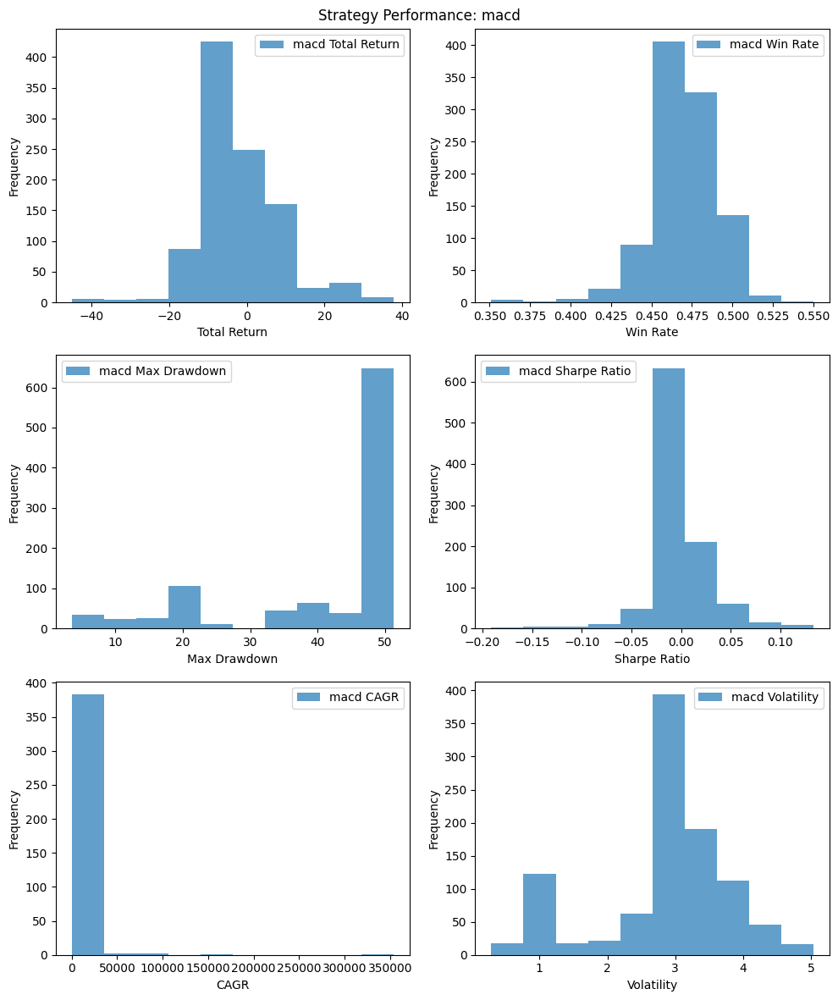

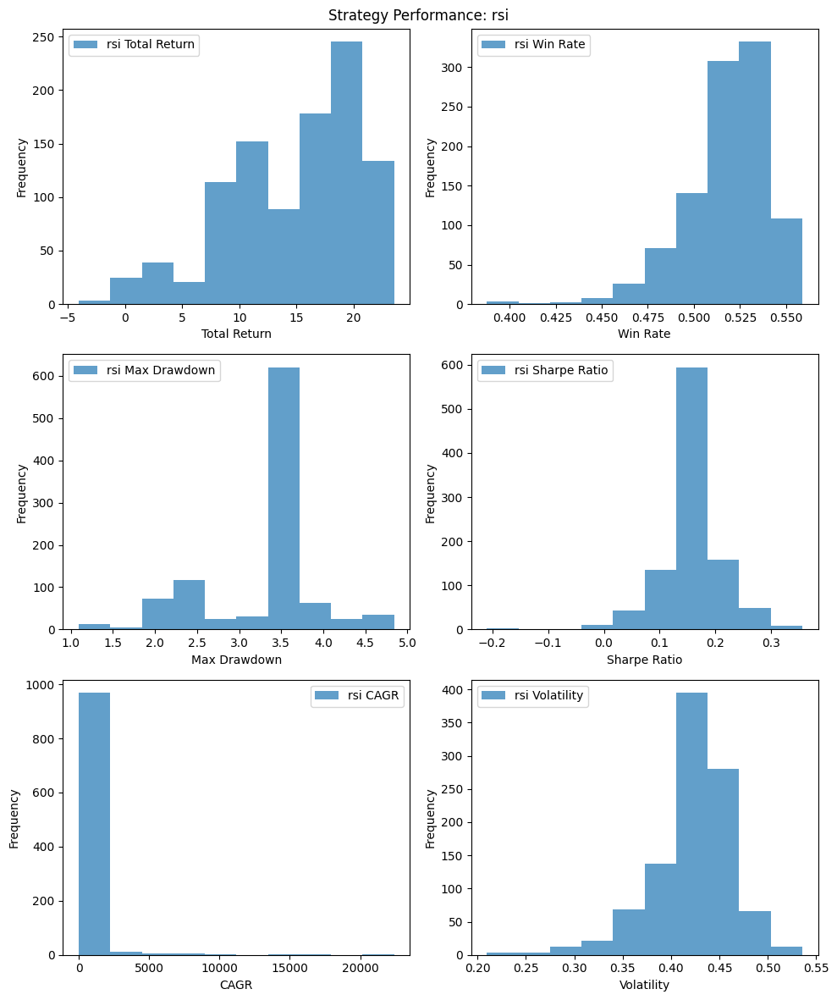

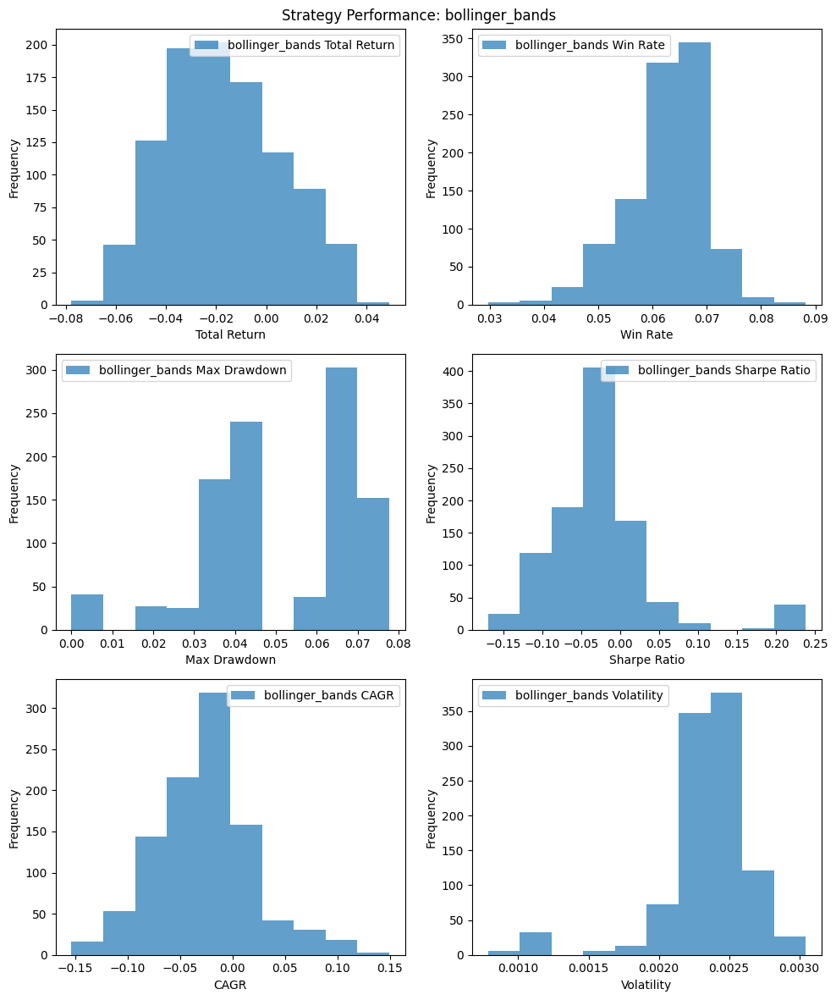

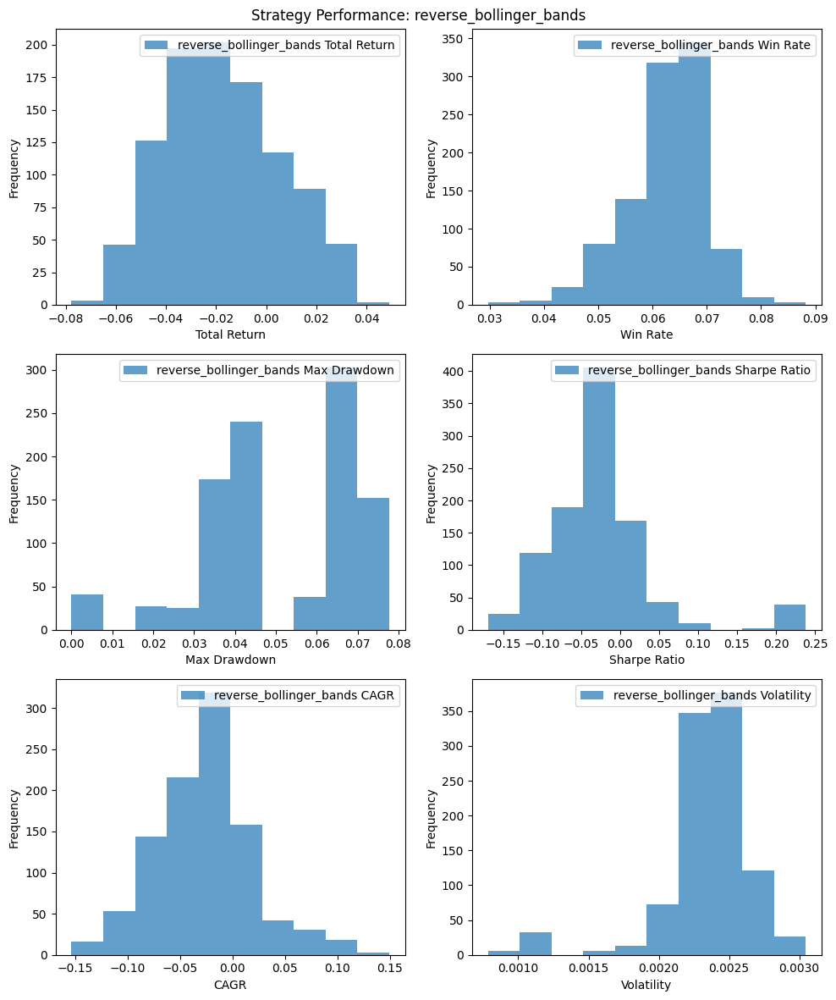

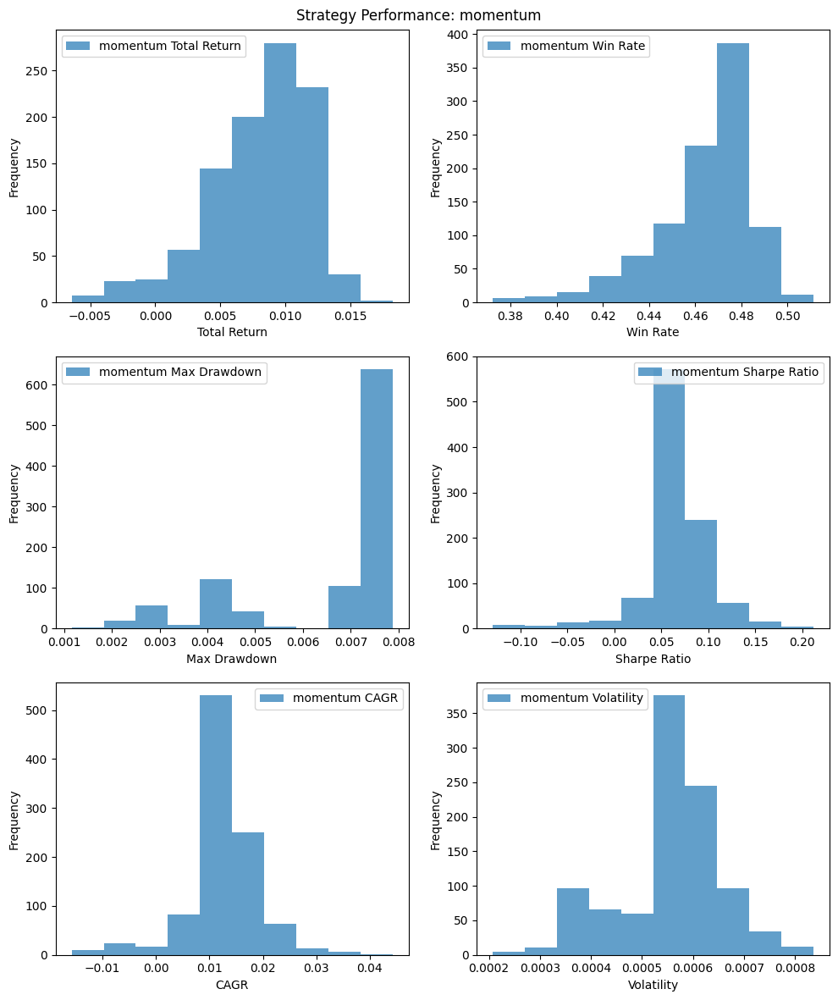

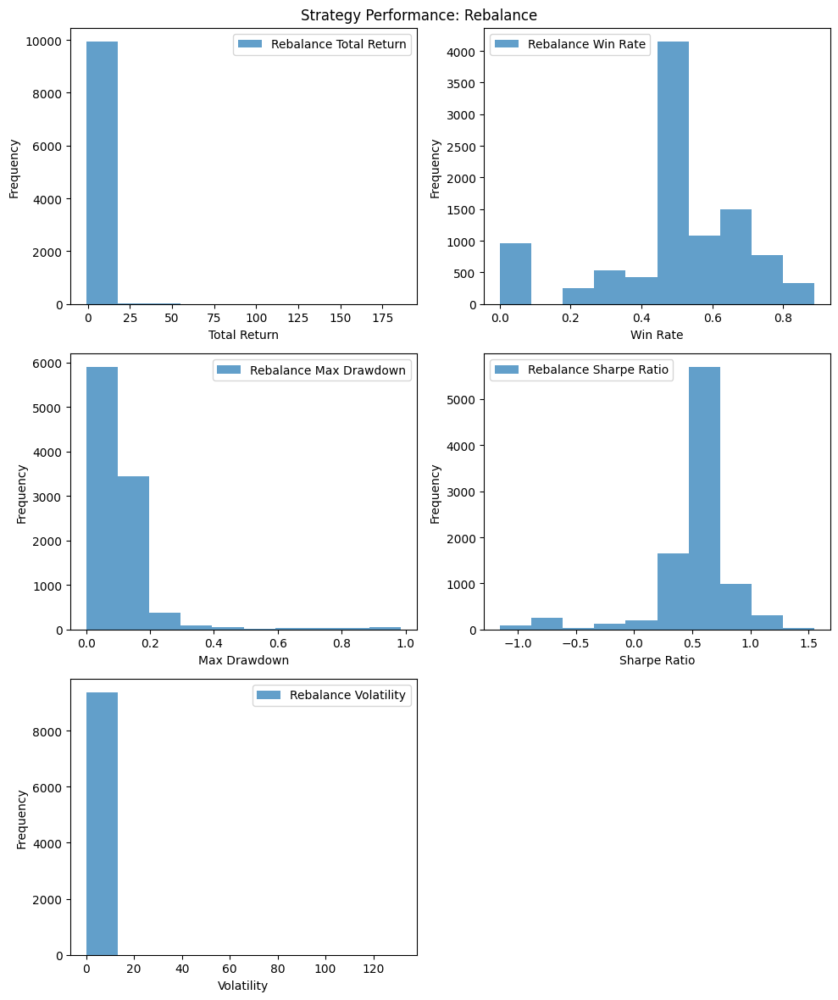

In [5]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
from itertools import product
from datetime import datetime, timedelta
import seaborn as sns

# 데이터 로드
assets = ['BTC-USD', 'TLT', 'QQQ', 'SPY', 'GLD']
end_date = datetime.today().strftime('%Y-%m-%d')
data = yf.download(assets, start="2023-07-01", end=end_date)['Adj Close']

# 기술적 분석 전략 정의
def macd(data):
    macd_signals = pd.DataFrame(index=data.index)
    for asset in data.columns:
        exp1 = data[asset].ewm(span=12, adjust=False).mean()
        exp2 = data[asset].ewm(span=26, adjust=False).mean()
        macd = exp1 - exp2
        signal = macd.ewm(span=9, adjust=False).mean()
        macd_signals[asset] = macd - signal
    return macd_signals

def rsi(data, periods=14):
    rsi_signals = pd.DataFrame(index=data.index)
    for asset in data.columns:
        delta = data[asset].diff()
        gain = (delta.where(delta > 0, 0)).rolling(window=periods).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=periods).mean()
        rs = gain / loss
        rsi_signals[asset] = 100 - (100 / (1 + rs))
    return rsi_signals

def bollinger_bands(data, window=20, num_std=2):
    upper_band = pd.DataFrame(index=data.index)
    lower_band = pd.DataFrame(index=data.index)
    for asset in data.columns:
        rolling_mean = data[asset].rolling(window).mean()
        rolling_std = data[asset].rolling(window).std()
        upper_band[asset] = rolling_mean + (rolling_std * num_std)
        lower_band[asset] = rolling_mean - (rolling_std * num_std)
    return upper_band, lower_band

# 반대 볼린저 밴드 계산 함수
def reverse_bollinger_bands(data, window=20, num_std=2):
    upper_band = pd.DataFrame(index=data.index)
    lower_band = pd.DataFrame(index=data.index)
    for asset in data.columns:
        rolling_mean = data[asset].rolling(window).mean()
        rolling_std = data[asset].rolling(window).std()
        upper_band[asset] = rolling_mean + (rolling_std * num_std)
        lower_band[asset] = rolling_mean - (rolling_std * num_std)
    return upper_band, lower_band

# 2배 레버리지 전략
def leveraged_strategy(data, leverage=2):
    # 일일 수익률 계산
    returns = data.pct_change().dropna()
    
    # 레버리지 적용
    leveraged_returns = (1 + returns) ** leverage - 1
    
    # 누적 수익률 계산
    cumulative_return = (1 + leveraged_returns).cumprod() - 1
    
    return cumulative_return

# 트렌드 라인 전략
def trendline_strategy(data):
    trendline_signals = pd.DataFrame(index=data.index)
    for asset in data.columns:
        # 데이터의 절반을 사용하여 선형 회귀로 트렌드 라인 계산
        trendline = np.polyfit(range(len(data)), data[asset], 1)
        trend = np.polyval(trendline, range(len(data)))
        trendline_signals[asset] = data[asset] - trend
    return trendline_signals

# 포트폴리오 리밸런싱 전략
def rebalance_portfolio(data, weights, rebalance_period='M'):
    weights = np.array(weights)
    weights /= np.sum(weights)  # 가중치 정규화
    portfolio = (data * weights).sum(axis=1)
    rebalanced_portfolio = portfolio.resample(rebalance_period).last().pct_change().fillna(0)
    return rebalanced_portfolio

# 모멘텀 전략
def momentum_strategy(data, lookback_period=12):
    momentum_signals = data.pct_change(lookback_period).shift(1)
    return momentum_signals

# 전략 실행 함수
def execute_strategy(data, strategy, **kwargs):
    if strategy == 'macd':
        return macd(data)
    elif strategy == 'rsi':
        return rsi(data)
    elif strategy == 'bollinger_bands':
        return bollinger_bands(data)
    elif strategy == 'reverse_bollinger_bands':
        return reverse_bollinger_bands(data)
    elif strategy == 'rebalance':
        return rebalance_portfolio(data, kwargs['weights'], kwargs.get('rebalance_period', 'M'))
    elif strategy == 'momentum':
        return momentum_strategy(data, kwargs.get('lookback_period', 12))
    elif strategy == 'leveraged':
        return leveraged_strategy(data, leverage=kwargs.get('leverage', 2))
    elif strategy == 'trendline':
        return trendline_strategy(data)
    else:
        raise ValueError("Unknown strategy")

# 랜덤 기간 생성 (1년 내의 랜덤한 시작일과 기간을 생성)
def generate_random_periods(start_date, end_date, num_periods=50, min_days=90):
    periods = []
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    for _ in range(num_periods):
        days = random.randint(min_days, 365)
        start = pd.to_datetime(random.choice(pd.date_range(start=start_date, end=end_date - timedelta(days=days))))
        end = start + timedelta(days=days)
        periods.append((start, end))
    return periods

# 전략 평가
def evaluate_strategy(data, strategy, start_date, end_date, **kwargs):
    subset = data.loc[start_date:end_date]
    if subset.empty:
        return None, None, None, None
    
    result = execute_strategy(subset, strategy, **kwargs)
    
    if strategy in ['bollinger_bands', 'reverse_bollinger_bands']:
        upper_band, lower_band = result
        if upper_band.empty or lower_band.empty:
            return None, None, None, None
    else:
        if result is None or result.empty:
            return None, None, None, None

    returns = subset.pct_change().dropna()
    
    if strategy in ['macd', 'rsi', 'momentum', 'trendline']:
        signals = result.shift(1).dropna()
        strategy_returns = (signals * returns).mean(axis=1)
    elif strategy in ['bollinger_bands', 'reverse_bollinger_bands']:
        position = pd.DataFrame(index=subset.index)
        for asset in subset.columns:
            position[asset] = np.where(subset[asset] > upper_band[asset], -1, np.where(subset[asset] < lower_band[asset], 1, 0))
        strategy_returns = (position.shift(1) * returns).mean(axis=1)
    elif strategy in ['rebalance', 'leveraged']:
        strategy_returns = result
    else:
        return None, None, None, None

    total_return = strategy_returns.sum()
    win_rate = (strategy_returns > 0).mean()
    max_drawdown = (strategy_returns.cumsum().cummax() - strategy_returns.cumsum()).max()
    sharpe_ratio = strategy_returns.mean() / strategy_returns.std()
    volatility = strategy_returns.std()
    
    return total_return, win_rate, max_drawdown, sharpe_ratio, volatility

# 리밸런싱 전략의 평가
def evaluate_rebalance_strategy(data, num_iterations=500):
    periods = ['M', 'Q', 'A']  # 월간, 분기별, 연간 주기
    all_results = []
    
    for _ in range(num_iterations):
        weights = np.random.dirichlet(np.ones(len(assets)), size=1)[0]
        period = random.choice(periods)
        
        random_periods = generate_random_periods("2023-07-01", "2024-08-20", 10, min_days=90)
        for start_date, end_date in random_periods:
            total_return, win_rate, max_drawdown, sharpe_ratio, volatility = evaluate_strategy(
                data, 'rebalance', start_date, end_date, weights=weights, rebalance_period=period
            )
            result = {
                'Period': period,
                'Total Return': total_return,
                'Win Rate': win_rate,
                'Max Drawdown': max_drawdown,
                'Sharpe Ratio': sharpe_ratio,
                'Volatility': volatility,
                'Start Date': start_date,
                'End Date': end_date
            }
            # 각 자산의 가중치를 개별 열로 추가
            for i, weight in enumerate(weights):
                result[f'Weight_{i}'] = weight
            all_results.append(result)
    
    return pd.DataFrame(all_results)

# 전략 평가 (여기서 누락된 함수 추가)
def evaluate_all_strategies(data, strategies, num_iterations=1000, **kwargs):
    all_results = {strategy: {'Total Return': [], 'Win Rate': [], 'Max Drawdown': [], 'Sharpe Ratio': [], 'CAGR': [], 'Volatility': []} for strategy in strategies}
    for _ in range(num_iterations):
        random_periods = generate_random_periods("2023-07-01", "2024-08-20", 1)
        start_date, end_date = random_periods[0]
        for strategy in strategies:
            total_return, win_rate, max_drawdown, sharpe_ratio, volatility = evaluate_strategy(data, strategy, start_date, end_date, **kwargs)
            if total_return is not None:
                all_results[strategy]['Total Return'].append(total_return)
                all_results[strategy]['Win Rate'].append(win_rate)
                all_results[strategy]['Max Drawdown'].append(max_drawdown)
                all_results[strategy]['Sharpe Ratio'].append(sharpe_ratio)

                # 추가 분석 지표 계산
                duration_years = (end_date - start_date).days / 365.25
                cagr = ((1 + total_return) ** (1 / duration_years)) - 1
                
                all_results[strategy]['CAGR'].append(cagr)
                all_results[strategy]['Volatility'].append(volatility)
                
    return all_results

# 전략 평가 실행 (각각 1000번씩)
strategies = ['macd', 'rsi', 'bollinger_bands', 'reverse_bollinger_bands', 'momentum']
all_results = evaluate_all_strategies(data, strategies, num_iterations=1000)

# 리밸런싱 전략 평가 실행
rebalance_results = evaluate_rebalance_strategy(data, num_iterations=1000)

# 최종 추천 전략 출력
summary_results = {}
for strategy, metrics in all_results.items():
    avg_total_return = np.mean(metrics['Total Return'])
    avg_win_rate = np.mean(metrics['Win Rate'])
    avg_max_drawdown = np.mean(metrics['Max Drawdown'])
    avg_sharpe_ratio = np.mean(metrics['Sharpe Ratio'])
    avg_cagr = np.mean(metrics['CAGR'])
    avg_volatility = np.mean(metrics['Volatility'])

    summary_results[strategy] = {
        'Avg Total Return': avg_total_return,
        'Avg Win Rate': avg_win_rate,
        'Avg Max Drawdown': avg_max_drawdown,
        'Avg Sharpe Ratio': avg_sharpe_ratio,
        'Avg CAGR': avg_cagr,
        'Avg Volatility': avg_volatility,
    }

best_strategy = max(summary_results, key=lambda x: summary_results[x]['Avg Sharpe Ratio'])
print(f"\n가장 추천하는 전략은 {best_strategy} 입니다. (Sharpe Ratio 기준)")

# 시각화 함수 정의 (Max Drawdown 포함)
def visualize_results_with_drawdown(results):
    for strategy, metrics in results.items():
        plt.figure(figsize=(10, 12))
        plt.suptitle(f"Strategy Performance: {strategy}")
        
        plt.subplot(3, 2, 1)
        plt.hist(metrics['Total Return'], bins=10, alpha=0.7, label=f'{strategy} Total Return')
        plt.xlabel('Total Return')
        plt.ylabel('Frequency')
        plt.legend()
        
        plt.subplot(3, 2, 2)
        plt.hist(metrics['Win Rate'], bins=10, alpha=0.7, label=f'{strategy} Win Rate')
        plt.xlabel('Win Rate')
        plt.ylabel('Frequency')
        plt.legend()
        
        plt.subplot(3, 2, 3)
        plt.hist(metrics['Max Drawdown'], bins=10, alpha=0.7, label=f'{strategy} Max Drawdown')
        plt.xlabel('Max Drawdown')
        plt.ylabel('Frequency')
        plt.legend()
        
        plt.subplot(3, 2, 4)
        plt.hist(metrics['Sharpe Ratio'], bins=10, alpha=0.7, label=f'{strategy} Sharpe Ratio')
        plt.xlabel('Sharpe Ratio')
        plt.ylabel('Frequency')
        plt.legend()

        plt.subplot(3, 2, 5)
        plt.hist(metrics['CAGR'], bins=10, alpha=0.7, label=f'{strategy} CAGR')
        plt.xlabel('CAGR')
        plt.ylabel('Frequency')
        plt.legend()

        plt.subplot(3, 2, 6)
        plt.hist(metrics['Volatility'], bins=10, alpha=0.7, label=f'{strategy} Volatility')
        plt.xlabel('Volatility')
        plt.ylabel('Frequency')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

# 시각화 결과 출력 (Max Drawdown 포함)
visualize_results_with_drawdown(all_results)

# 리밸런싱 전략 시각화 추가 (Max Drawdown 포함)
rebalance_metrics = {
    'Total Return': rebalance_results['Total Return'],
    'Win Rate': rebalance_results['Win Rate'],
    'Max Drawdown': rebalance_results['Max Drawdown'],
    'Sharpe Ratio': rebalance_results['Sharpe Ratio'],
    'Volatility': rebalance_results['Volatility']
}

plt.figure(figsize=(10, 12))
plt.suptitle("Strategy Performance: Rebalance")

plt.subplot(3, 2, 1)
plt.hist(rebalance_metrics['Total Return'], bins=10, alpha=0.7, label='Rebalance Total Return')
plt.xlabel('Total Return')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 2, 2)
plt.hist(rebalance_metrics['Win Rate'], bins=10, alpha=0.7, label='Rebalance Win Rate')
plt.xlabel('Win Rate')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 2, 3)
plt.hist(rebalance_metrics['Max Drawdown'], bins=10, alpha=0.7, label='Rebalance Max Drawdown')
plt.xlabel('Max Drawdown')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 2, 4)
plt.hist(rebalance_metrics['Sharpe Ratio'], bins=10, alpha=0.7, label='Rebalance Sharpe Ratio')
plt.xlabel('Sharpe Ratio')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(3, 2, 5)
plt.hist(rebalance_metrics['Volatility'], bins=10, alpha=0.7, label='Rebalance Volatility')
plt.xlabel('Volatility')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


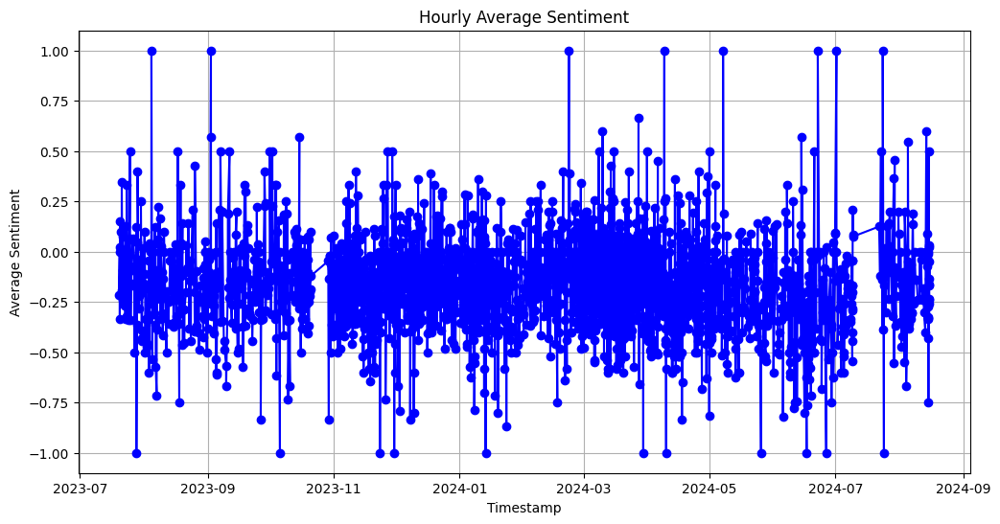

In [21]:
# 커뮤니티 데이터 시각화
import pandas as pd
import matplotlib.pyplot as plt

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# date 열을 문자열로 변환
data['date'] = data['date'].astype(str)

# year, date, hour를 결합하여 timestamp 열 생성
data['timestamp'] = pd.to_datetime(data['year'].astype(str) + '-' + data['date'].str.split('-').str[1] + '-' + data['date'].str.split('-').str[2]) + pd.to_timedelta(data['hour'], unit='h')

# timestamp를 인덱스로 설정
data.set_index('timestamp', inplace=True)

# 시간별 평균 감정 점수 시각화
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['average_sentiment'], marker='o', linestyle='-', color='b')
plt.title('Hourly Average Sentiment')
plt.xlabel('Timestamp')
plt.ylabel('Average Sentiment')
plt.grid(True)
plt.show()

In [23]:
data.columns

Index(['year', 'date', 'hour', 'average_sentiment', 'positive_ratio',
       'negative_ratio', 'total_posts', 'avg_word_count'],
      dtype='object')

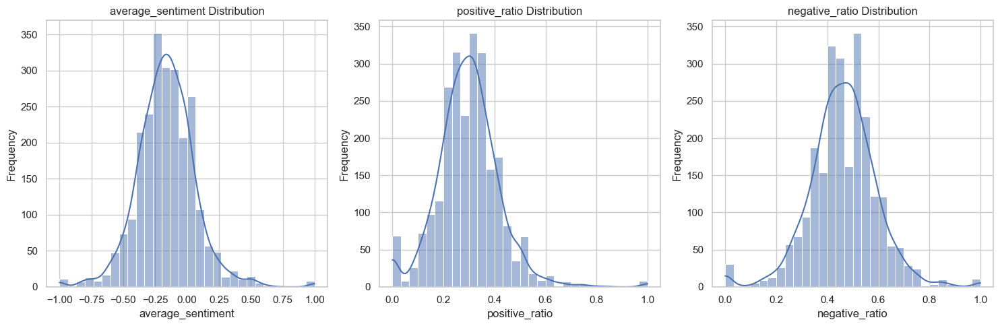

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# 시각화를 위한 설정
sns.set(style="whitegrid")

# 각 feature에 대한 정규 분포 시각화
features = ['average_sentiment', 'positive_ratio', 'negative_ratio']

plt.figure(figsize=(15, 5))

for i, feature in enumerate(features, 1):
    plt.subplot(1, 3, i)
    sns.histplot(data[feature], kde=True, bins=30)
    plt.title(f'{feature} Distribution')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [25]:
import pandas as pd

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# 통계값을 계산할 feature 목록
features = ['average_sentiment', 'positive_ratio', 'negative_ratio']

# 각 feature에 대한 통계값 계산
statistics = data[features].describe()

# 통계값 출력
print(statistics)

       average_sentiment  positive_ratio  negative_ratio
count        2446.000000     2446.000000     2446.000000
mean           -0.163759        0.297188        0.460909
std             0.229250        0.123032        0.133518
min            -1.000000        0.000000        0.000000
25%            -0.300000        0.222222        0.380952
50%            -0.162041        0.300000        0.460000
75%            -0.032258        0.360000        0.540000
max             1.000000        1.000000        1.000000


In [27]:
import pandas as pd
from scipy.stats import norm

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# 통계값을 계산할 feature 목록
features = ['average_sentiment', 'positive_ratio', 'negative_ratio', 'total_posts', 'avg_word_count']

# 각 feature에 대한 정규 분포 통계값 계산 및 출력
for feature in features:
    mean = data[feature].mean()
    std_dev = data[feature].std()
    print(f'Feature: {feature}')
    print(f'  Mean: {mean}')
    print(f'  Standard Deviation: {std_dev}')
    print(f'  Normal Distribution PDF at Mean: {norm.pdf(mean, mean, std_dev)}')
    print()

Feature: average_sentiment
  Mean: -0.16375876429125427
  Standard Deviation: 0.2292496259566436
  Normal Distribution PDF at Mean: 1.7402090788007736

Feature: positive_ratio
  Mean: 0.2971876670373408
  Standard Deviation: 0.123032236432592
  Normal Distribution PDF at Mean: 3.242583342130896

Feature: negative_ratio
  Mean: 0.4609088857454219
  Standard Deviation: 0.13351793474528442
  Normal Distribution PDF at Mean: 2.9879302818943767

Feature: total_posts
  Mean: 40.04701553556828
  Standard Deviation: 32.626081335618146
  Normal Distribution PDF at Mean: 0.012227710594404247

Feature: avg_word_count
  Mean: 10.582044376558722
  Standard Deviation: 5.537844717029355
  Normal Distribution PDF at Mean: 0.07203926812441137



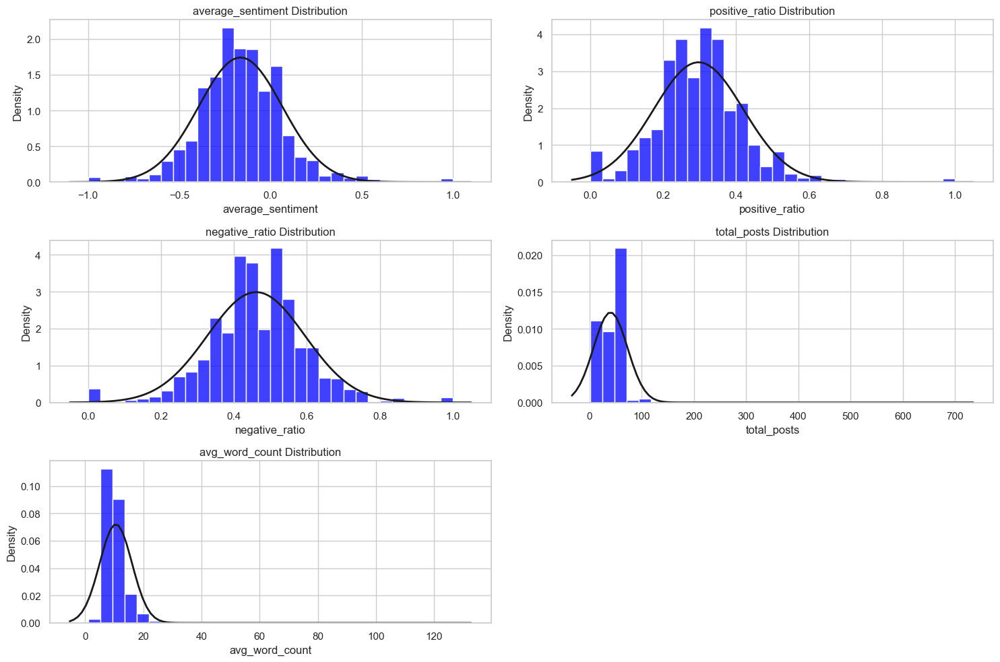

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# 통계값을 계산할 feature 목록
features = ['average_sentiment', 'positive_ratio', 'negative_ratio', 'total_posts', 'avg_word_count']

# 시각화를 위한 설정
sns.set(style="whitegrid")

plt.figure(figsize=(15, 10))

# 각 feature에 대한 정규 분포 시각화
for i, feature in enumerate(features, 1):
    plt.subplot(3, 2, i)
    sns.histplot(data[feature], kde=False, bins=30, color='blue', stat='density')
    
    # 정규 분포 곡선 그리기
    mean = data[feature].mean()
    std_dev = data[feature].std()
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mean, std_dev)
    plt.plot(x, p, 'k', linewidth=2)
    
    plt.title(f'{feature} Distribution')
    plt.xlabel(feature)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()

       average_sentiment  positive_ratio  negative_ratio  total_posts  \
count        2446.000000     2446.000000     2446.000000  2446.000000   
mean           -0.163759        0.297188        0.460909    40.047016   
std             0.229250        0.123032        0.133518    32.626081   
min            -1.000000        0.000000        0.000000     1.000000   
25%            -0.300000        0.222222        0.380952    24.000000   
50%            -0.162041        0.300000        0.460000    49.000000   
75%            -0.032258        0.360000        0.540000    50.000000   
max             1.000000        1.000000        1.000000   700.000000   

       avg_word_count  
count     2446.000000  
mean        10.582044  
std          5.537845  
min          1.000000  
25%          8.000000  
50%          9.460000  
75%         11.680000  
max        126.411765  


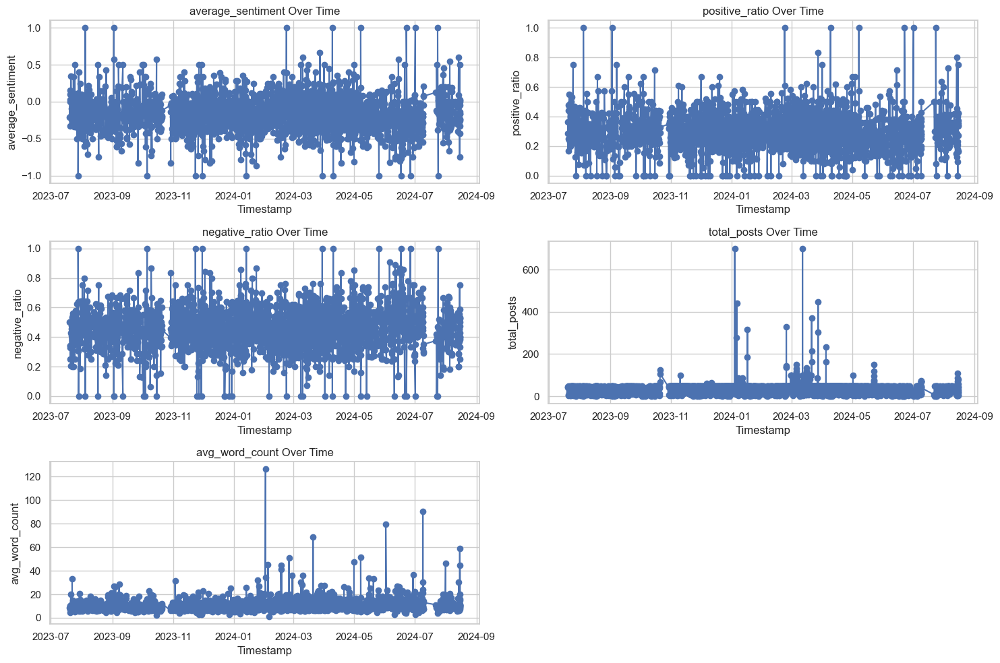

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# 예제 데이터 로드 (파일 경로를 지정하세요)
# data = pd.read_csv('path_to_your_file.csv')

# date 열이 이미 연도를 포함하고 있는지 확인
# 예를 들어, date 열이 '2023-07-19' 형식이라면 year 열과 결합할 필요가 없습니다.
# year, date, hour를 결합하여 timestamp 열 생성
data['timestamp'] = pd.to_datetime(data['date'].astype(str) + ' ' + data['hour'].astype(str) + ':00:00')

# timestamp를 인덱스로 설정
data.set_index('timestamp', inplace=True)

# 통계값을 계산할 feature 목록
features = ['average_sentiment', 'positive_ratio', 'negative_ratio', 'total_posts', 'avg_word_count']

# 각 feature에 대한 통계값 계산 및 출력
statistics = data[features].describe()
print(statistics)

# 시각화를 위한 설정
plt.figure(figsize=(15, 10))

# 각 feature에 대한 시계열 시각화
for i, feature in enumerate(features, 1):
    plt.subplot(3, 2, i)
    plt.plot(data.index, data[feature], marker='o', linestyle='-', color='b')
    plt.title(f'{feature} Over Time')
    plt.xlabel('Timestamp')
    plt.ylabel(feature)
    plt.grid(True)

plt.tight_layout()
plt.show()

In [46]:
import pandas as pd

# JSON 파일 로드 (파일 경로를 지정하세요)
data = pd.read_json('prediction_price_data.json')

# 데이터 확인
data

,date,price
0,2024-08-21 13:01:00,52616.845352
1,2024-08-21 13:02:00,52713.236334
2,2024-08-21 13:03:00,52628.528768
3,2024-08-21 13:04:00,52413.502657
4,2024-08-21 13:05:00,52553.089863
...,...,...
1426,2024-08-22 12:47:00,44866.718973
1427,2024-08-22 12:48:00,44926.308218
1428,2024-08-22 12:49:00,44847.053906
1429,2024-08-22 12:50:00,44847.053906


C:\Users\ansck\AppData\Local\Temp\ipykernel_17936\2194506733.py:14: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_data = data.resample('H').mean()


                            price
date                             
2024-08-21 13:00:00  50860.939277
2024-08-21 14:00:00  48982.475793
2024-08-21 15:00:00  47320.456147
2024-08-21 16:00:00  45612.652981
2024-08-21 17:00:00  44880.163651


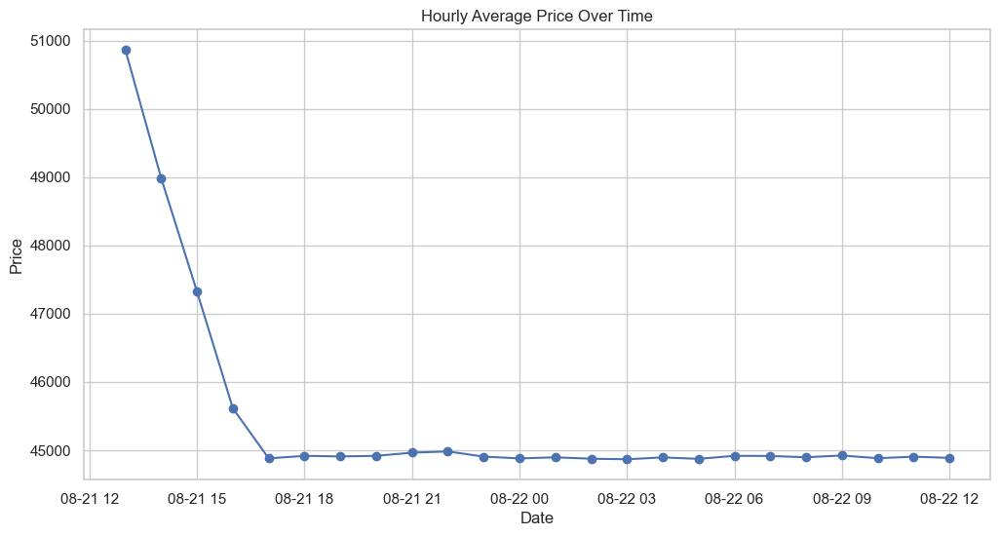

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# 예제 데이터 로드 (이미 DataFrame으로 로드된 상태라고 가정)
# data = pd.read_json('prediction_price_data.json')

# date 열을 datetime 형식으로 변환
data['date'] = pd.to_datetime(data['date'])

# date 열을 인덱스로 설정
data.set_index('date', inplace=True)

# 1시간 단위로 리샘플링하여 평균 가격 계산
hourly_data = data.resample('H').mean()

# 데이터 확인
print(hourly_data.head())

# 시계열 데이터 시각화
plt.figure(figsize=(12, 6))
plt.plot(hourly_data.index, hourly_data['price'], marker='o', linestyle='-', color='b')
plt.title('Hourly Average Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.show()

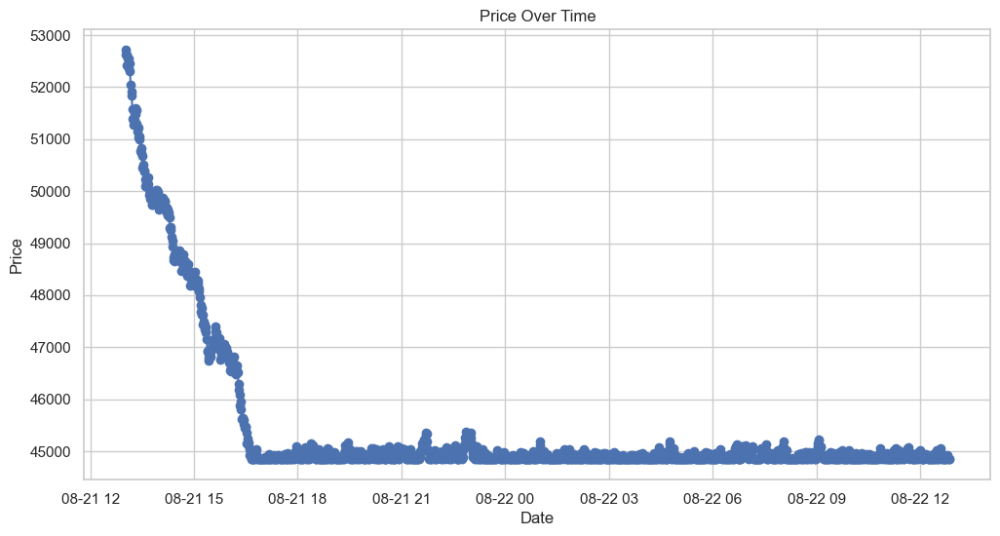

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# 예제 데이터 로드 (이미 DataFrame으로 로드된 상태라고 가정)
# data = pd.read_json('prediction_price_data.json')

# date 열을 datetime 형식으로 변환
data['date'] = pd.to_datetime(data['date'])

# date 열을 인덱스로 설정
data.set_index('date', inplace=True)

# 시계열 데이터 시각화
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['price'], marker='o', linestyle='-', color='b')
plt.title('Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.show()

[*********************100%%**********************]  1 of 1 completed


                                   Open          High           Low  \
Datetime                                                              
2023-08-22 09:00:00+00:00  26056.466797  26073.929688  26028.630859   
2023-08-22 10:00:00+00:00  26045.462891  26053.183594  26019.642578   
2023-08-22 11:00:00+00:00  26035.992188  26057.953125  26021.357422   
2023-08-22 12:00:00+00:00  26039.660156  26089.677734  26039.660156   
2023-08-22 13:00:00+00:00  26035.892578  26047.197266  25980.755859   

                                  Close     Adj Close    Volume  
Datetime                                                         
2023-08-22 09:00:00+00:00  26046.875000  26046.875000         0  
2023-08-22 10:00:00+00:00  26038.138672  26038.138672         0  
2023-08-22 11:00:00+00:00  26045.750000  26045.750000         0  
2023-08-22 12:00:00+00:00  26061.193359  26061.193359         0  
2023-08-22 13:00:00+00:00  25995.751953  25995.751953  57553920  


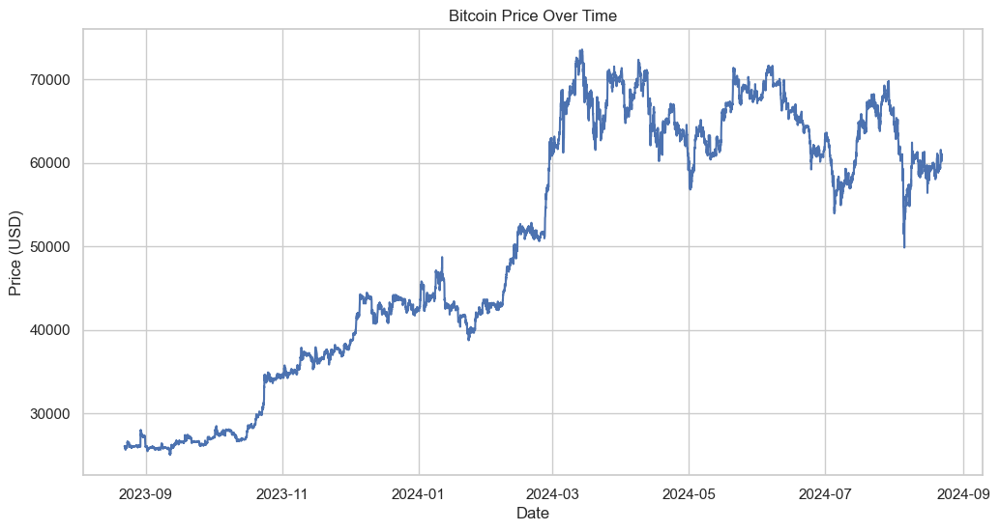

In [43]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# 비트코인 티커 심볼
ticker = 'BTC-USD'

# 1년치 데이터 가져오기
data = yf.download(ticker, period='1y', interval='1h')

# 데이터 확인
print(data.head())

# 시계열 데이터 시각화
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['Close'], linestyle='-', color='b')
plt.title('Bitcoin Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.grid(True)
plt.show()